### Device to CUDA or MPS

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.image import imsave
from latex import latexify, format_axes
try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange
    
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
%config InlineBackend.figure_format = "retina"

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
    
print(device)

cuda


### The Image $(427 \times 640)$
### Source: [Link](https://unsplash.com/photos/coconut-trees-and-body-of-water-painting-eaI3VpRnMbw)

![beach](beach.jpeg)

In [2]:
img = torchvision.io.read_image("beach.jpeg")
print(img.shape)

torch.Size([3, 427, 640])


### RGB Channels

In [3]:
print(img[0].shape, img[1].shape, img[2].shape)
img[0]

torch.Size([427, 640]) torch.Size([427, 640]) torch.Size([427, 640])


tensor([[  2,   2,   2,  ...,   0,   0,   0],
        [  2,   2,   2,  ...,   0,   0,   0],
        [  2,   2,   2,  ...,   0,   0,   0],
        ...,
        [ 34,  33,  31,  ...,  77,  81,  90],
        [ 32,  30,  29,  ...,  97,  95,  97],
        [ 29,  28,  27,  ...,  90, 101, 107]], dtype=torch.uint8)

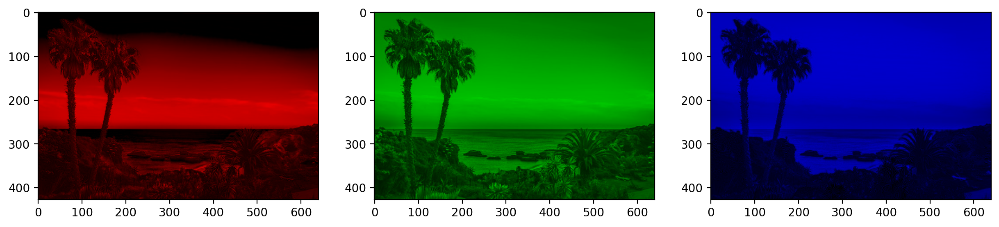

In [4]:
imgNumpy = rearrange(img, "c h w -> h w c").numpy()
imgR, imgG, imgB = imgNumpy.copy(), imgNumpy.copy(), imgNumpy.copy()
imgR[:, :, (1, 2)] = 0
imgG[:, :, (0, 2)] = 0
imgB[:, :, (0, 1)] = 0
fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (15, 15))
ax[0].imshow(imgR)
ax[1].imshow(imgG)
ax[2].imshow(imgB)
plt.show()

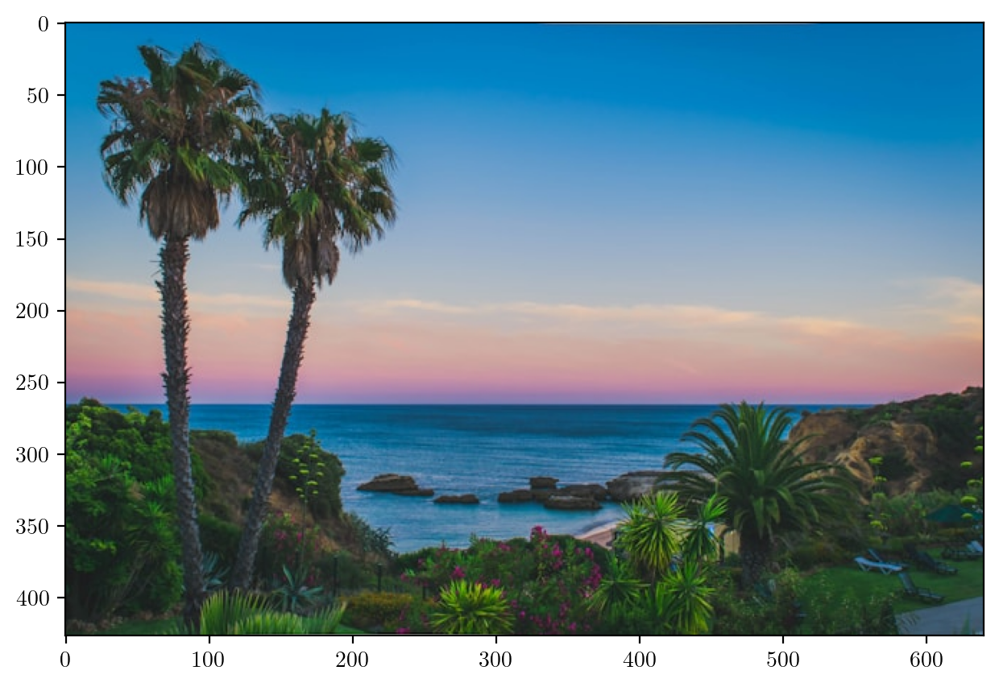

In [5]:
latexify(columns = 2, fig_width = 8)
plt.imshow(rearrange(img, "c h w -> h w c").numpy())
plt.show()

### <center> Scaled Complete Image </center>

In [69]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape
img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device, dtype = torch.float32)
img_scaled

tensor([[[0.0078, 0.0078, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
         [0.0078, 0.0078, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
         [0.0078, 0.0078, 0.0078,  ..., 0.0000, 0.0000, 0.0000],
         ...,
         [0.1333, 0.1294, 0.1216,  ..., 0.3020, 0.3176, 0.3529],
         [0.1255, 0.1176, 0.1137,  ..., 0.3804, 0.3725, 0.3804],
         [0.1137, 0.1098, 0.1059,  ..., 0.3529, 0.3961, 0.4196]],

        [[0.4941, 0.4941, 0.4941,  ..., 0.4275, 0.4275, 0.4275],
         [0.4941, 0.4941, 0.4941,  ..., 0.4275, 0.4275, 0.4275],
         [0.4941, 0.4941, 0.4941,  ..., 0.4275, 0.4275, 0.4275],
         ...,
         [0.1882, 0.1843, 0.1765,  ..., 0.4392, 0.4275, 0.4549],
         [0.1961, 0.1882, 0.1843,  ..., 0.5255, 0.4902, 0.4863],
         [0.2039, 0.2000, 0.1961,  ..., 0.5137, 0.5294, 0.5412]],

        [[0.7373, 0.7373, 0.7373,  ..., 0.6824, 0.6824, 0.6824],
         [0.7373, 0.7373, 0.7373,  ..., 0.6824, 0.6824, 0.6824],
         [0.7373, 0.7373, 0.7373,  ..., 0.6824, 0.6824, 0.

### Function to extract patch $(d \times d)$ from TopLeft corner $(X, Y)$ containing $N$ different colors

In [7]:
def mask_image(img, Corner, d, verbose, display = True):
    X, Y = Corner
    latexify(columns = 2, fig_width = 10)
    img_copy = img.clone()
    img_copy[:, X : X + d, Y : Y + d] = float("nan")
    crop = torchvision.transforms.functional.crop(img.cpu(), X, Y, d, d)
    fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [img.shape[2] / (5 * d), 1]})
    fig.suptitle(fr"{verbose} with corner at $({Corner[0]}, {Corner[1]})$ and patch size = $({d} \times {d})$", fontsize = 16)
    ax[0].imshow(rearrange(img_copy, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Masked Image")
    ax[1].imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
    ax[1].set_title("Masked Crop")
    if (display):
        plt.show()
    else:
        plt.close()
    return img_copy, crop

## Gradient Descent using Adam Optimizer $A_{N \times M} \approx W_{N \times k} H_{k \times M}$

In [8]:
def factorize(Img, k, convergence, device = torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    Img = Img.to(device)
    Ws, Hs, losses, images = [], [], [], []
    for channel in range(Img.shape[0]):
        A = Img[channel]
        W = torch.randn(A.shape[0], k, requires_grad = True, device = device)
        H = torch.randn(k, A.shape[1], requires_grad = True, device = device)

        optimizer = optim.Adam([W, H], lr = 0.01)
        mask = ~torch.isnan(A)
        prev_loss = float('inf')
        for i in range(10000):

            diff_matrix = torch.mm(W, H) - A
            diff_vector = diff_matrix[mask]
            loss = torch.norm(diff_vector)
            
            if torch.abs(prev_loss - loss) < convergence:
                break
            
            optimizer.zero_grad()
            
            loss.backward()

            optimizer.step()
            
            prev_loss = loss.item()
            
        Ws.append(W)
        Hs.append(H)
        losses.append(loss)
        images.append(torch.mm(W, H))
    
    return Ws, Hs, losses, torch.stack([images[0], images[1], images[2]], dim = 0), i

#### $$ \text{PSNR} = 20 \log_{10}(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}})$$

In [9]:
def metrics(img1, img2, max_value = 1.0):
    rmse = torch.sqrt(F.mse_loss(img1, img2))
    psnr_value = 20 * torch.log10(max_value / rmse)
    return rmse, psnr_value.item()

## Function for Training and Plotting the Reconstructed Image

In [10]:
def train_reconstruct_plot(img, Corner, d, features, convergence, device, allowSave = False, FileName = None):
    imgSingle, croppedSingle = mask_image(img, Corner, d, "Single Colored Patch", display = False)
    Ws, Hs, losses, FinalImage, i = factorize(imgSingle, features, convergence, device)
    img_copy = FinalImage.clone()
    X, Y = Corner
    newCroppedSingle = img_copy[:, X : X + d, Y : Y + d]
    rmse, psnr = metrics(img, img_copy)
    latexify(columns = 2)
    fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [img.shape[2] / (3 * d), 1, img.shape[2] / (3 * d)]}, figsize = (15, 6))
    fig.suptitle(f"RMSE : {rmse} | PNSR : {psnr}" "\n" fr"Crop Corner = $({X}, {Y})$" "\n" f"Features = {features}" "\n" fr"Loss Red = {losses[0]}, Loss Green = {losses[0]}, Loss Blue = {losses[2]}" "\n" f"Converged after {i} iteration", fontsize = 12)
    ax[0].imshow(rearrange(imgSingle, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Masked Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
    ax[1].imshow(rearrange(croppedSingle, 'c h w -> h w c').cpu().numpy())
    ax[1].set_title("Patch" "\n" fr"$({d} \times {d})$")
    ax[2].imshow(rearrange(FinalImage, 'c h w -> h w c').cpu().detach().numpy())
    ax[2].set_title("Reconstructed Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
    if (allowSave):
        # FinalImage = F.normalize(FinalImage, 0, 1)
        FinalImage = (FinalImage - FinalImage.min()) / (FinalImage.max() - FinalImage.min())
        FinalImage = torch.clamp(FinalImage, 0, 1)
        imsave(f"{FileName}.png", rearrange(FinalImage, 'c h w -> h w c').cpu().detach().numpy())
    for i in range(3):
        ax[i].axis("off")
    plt.show()
    
    fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [1, 1]}, figsize = (8, 4))
    fig.suptitle("Comparison of Original and Reconstructed Patch", fontsize = 12)                                                  
    ax[0].imshow(rearrange(croppedSingle, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Original Patch")
    ax[0].axis("off")
    ax[1].imshow(rearrange(newCroppedSingle, 'c h w -> h w c').cpu().detach().numpy())
    ax[1].set_title("Reconstructed Patch")
    ax[1].axis("off")
    plt.show()

### $(30 \times 30)$ frame with **Single Color**

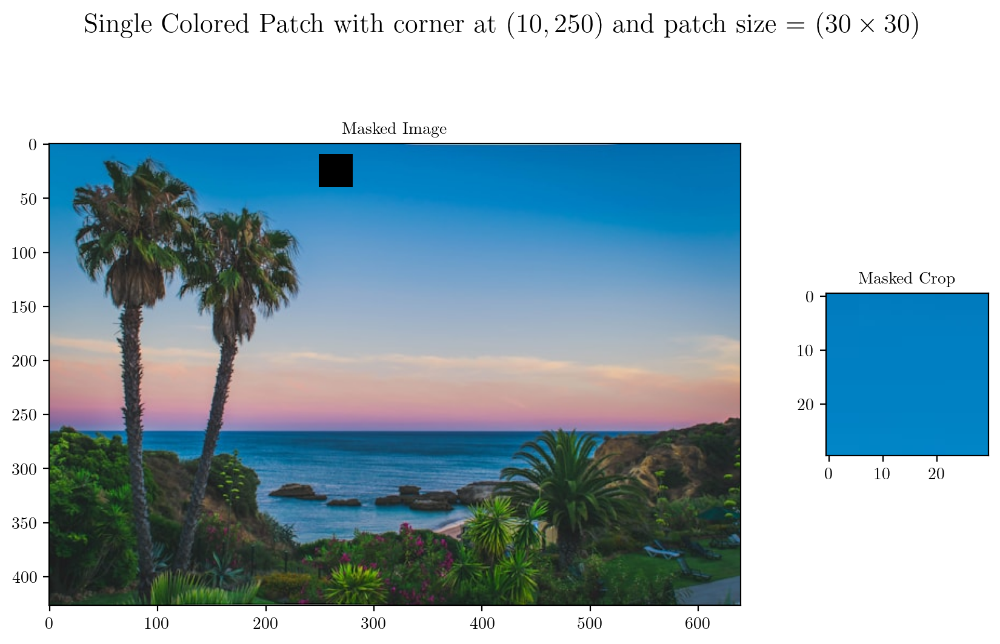

In [11]:
imgSingle30, croppedSingle30 = mask_image(img_scaled, (10, 250), 30, "Single Colored Patch")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


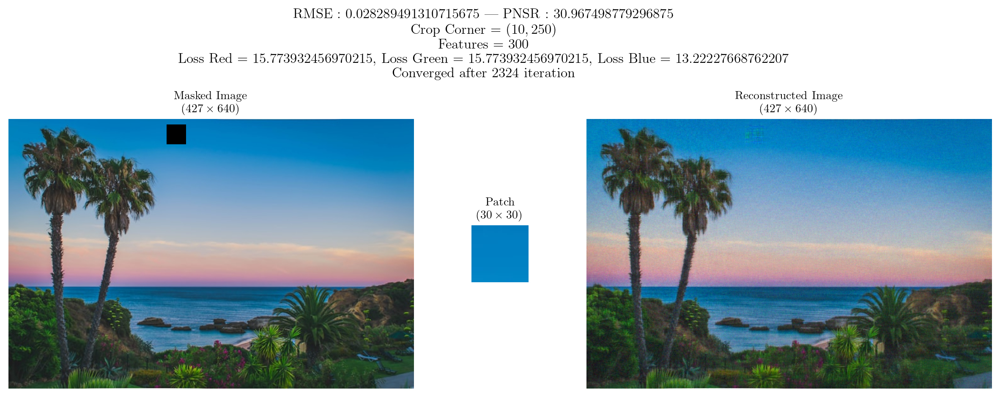

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


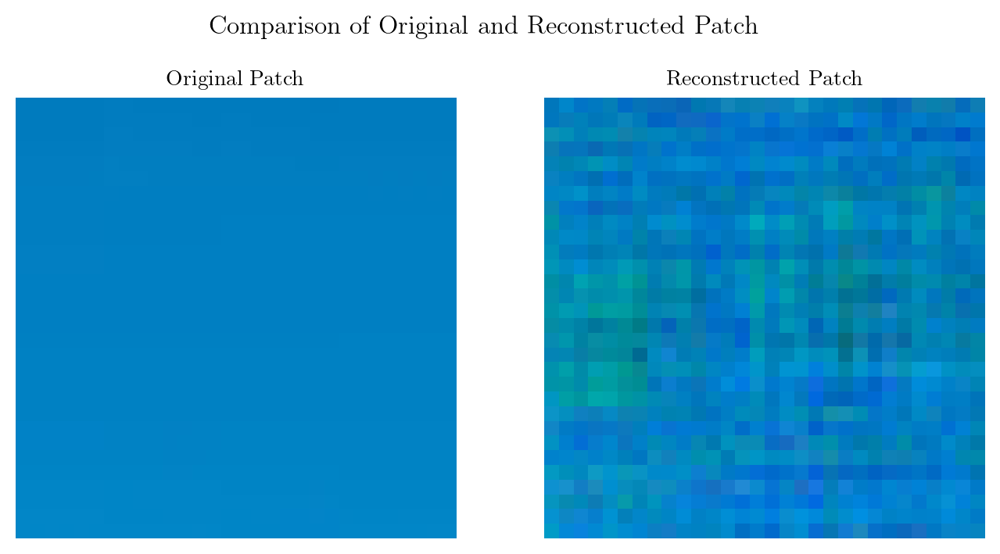

In [12]:
features = 300
train_reconstruct_plot(img_scaled, (10, 250), 30, features, 1e-5, device, allowSave = True, FileName = "./Q5Media/SingleColoredPatch30")

### $(30 \times 30)$ frame with **2-3 Colors**

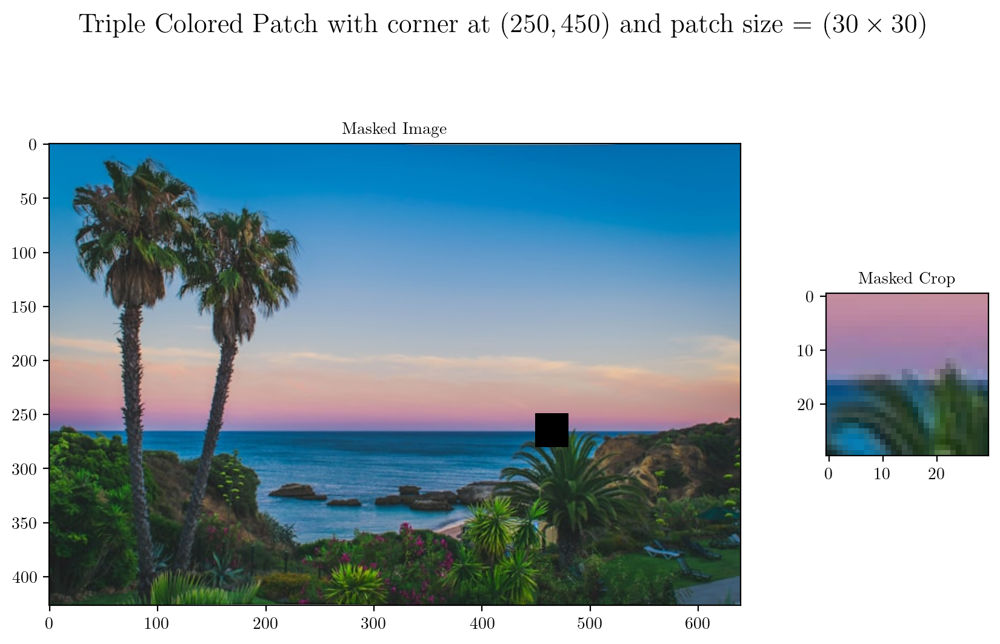

In [13]:
imgDouble30, croppedDouble30 = mask_image(img_scaled, (250, 450), 30, "Triple Colored Patch")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


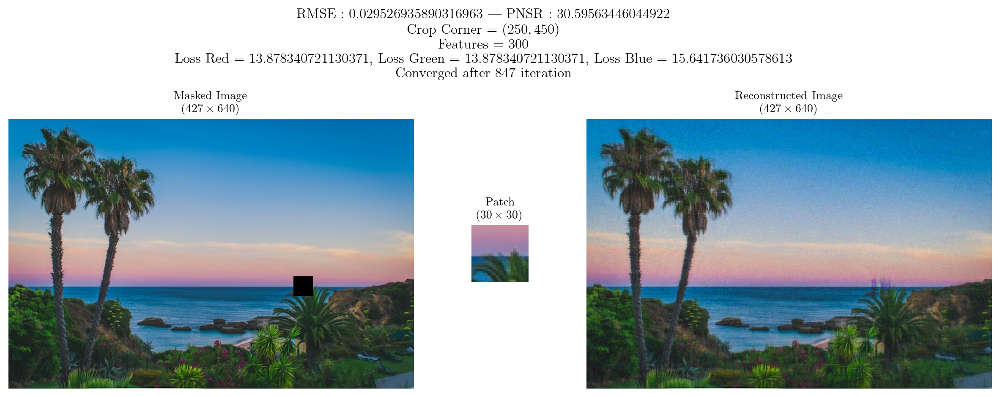

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


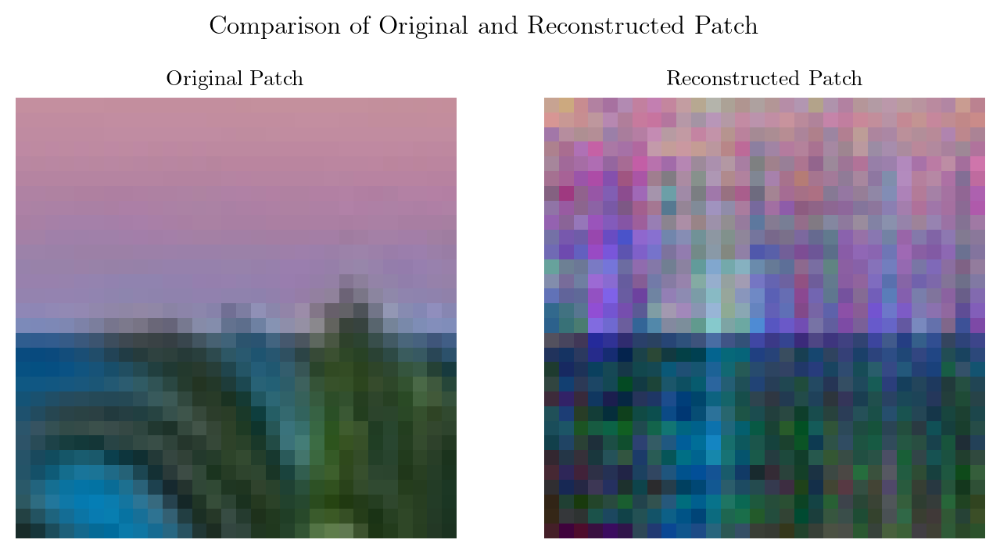

In [14]:
features = 300
train_reconstruct_plot(img_scaled, (250, 450), 30, features, 1e-5, device, allowSave = True, FileName = "./Q5Media/TripleColoredPatch30")

### $(30 \times 30)$ frame with atleast **5 Colors**

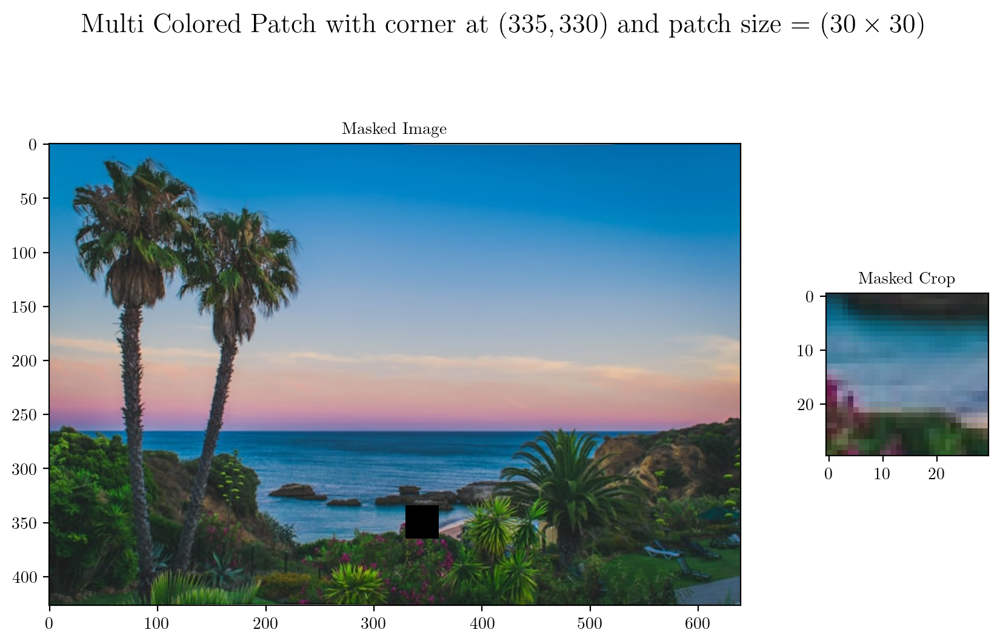

In [15]:
imgMulti30, croppedMulti30 = mask_image(img_scaled, (335, 330), 30, "Multi Colored Patch")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


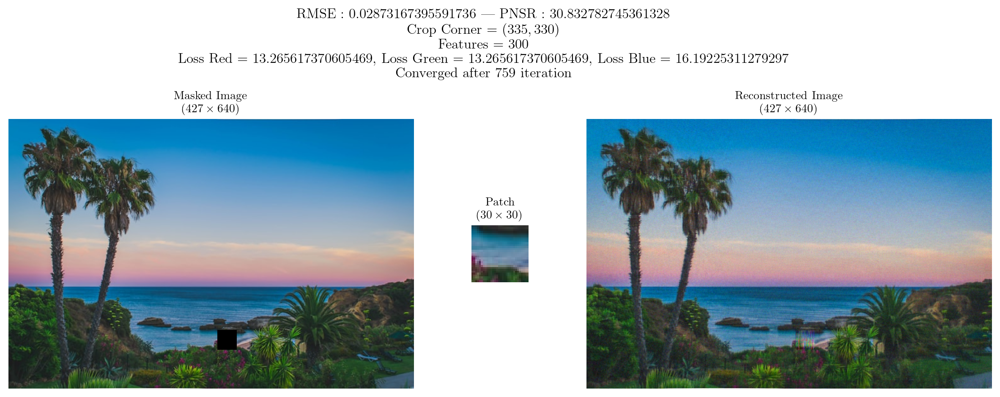

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


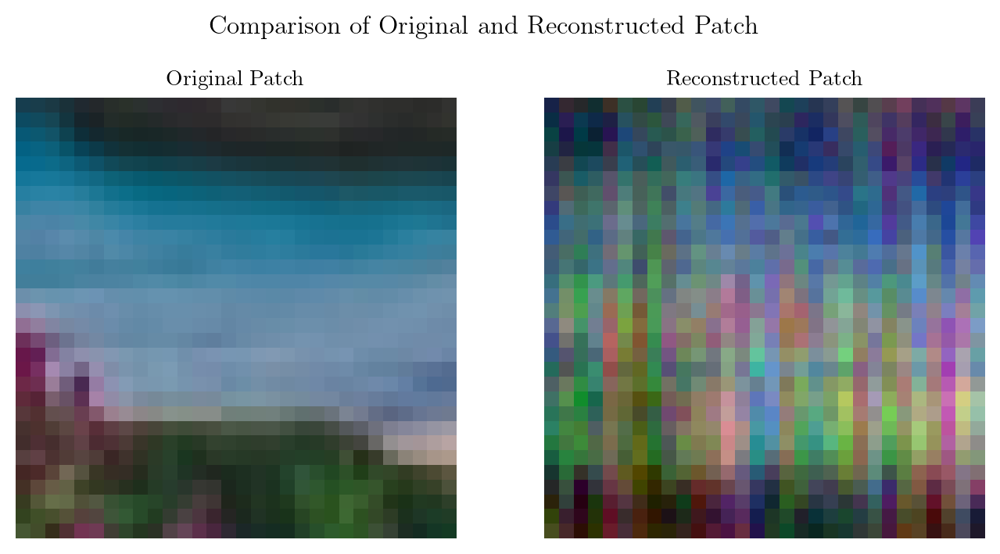

In [16]:
features = 300
train_reconstruct_plot(img_scaled, (335, 330), 30, features, 1e-5, device, allowSave = True, FileName = "./Q5Media/MultiColoredPatch30")

## <center> Random Fourier Features </center>

In [17]:
from sklearn.kernel_approximation import RBFSampler

### $$ \text{Cordinate Map}: \mathbb{R}^2 \to \mathbb{R}^3 : [X, Y] \to [R, G, B] $$
### $$ \text{Feature Map}: \mathbb{R}^{\text{features}} \to \mathbb{R}^3 : [X_{1 \cdots k}, Y_{1 \cdots k}] \to [R, G, B] $$
### $$ \text{Final Map}: \mathbb{R}^2 \to \mathbb{R}^{\text{features}} \to \mathbb{R}^3 : [X, Y] \to [X_{1 \cdots k}, Y_{1 \cdots k}] \to [R, G, B] $$
###  The Neural Network thus learns the approximation to $\text{Feature Map}$

In [18]:
def create_coordinate_map(img):
    
    """
    img: torch.Tensor of shape [num_channels, height, width]
    
    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    
    num_channels, height, width = img.shape
    
    mask = rearrange(~torch.isnan(img)[0], "h w -> (h w)").to(device)
    
    w_coords = torch.arange(width).repeat(height, 1)
    h_coords = torch.arange(height).repeat(width, 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)
    
    
    
    X = torch.stack([h_coords, w_coords], dim = 1).float()

    X = X.to(device)

    Y = rearrange(img, 'c h w -> (h w) c').float()
    
    X, Y = X[mask], Y[mask]
    return X, Y

![NN](NN.png)

In [19]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)

#### $\text{Original Image} \to (W \times H)$ and our cropped image has a patch of $(d \times d)$ removed, hence we have access to only $wh - d^2$ points' ($ \in \mathbb{R}^{\text{features}}$) RGB ($\in \mathbb{R}^3$) values as opposed to entire feature space's grid points $wh$, so we only learn/train the neural network on these reduced number of points $wh - d^2$ and predct on the entire feature space grid of $wh$ points. It is expected that the NN would be able to produce the RGB $\in \mathbb{R}^3$ of the missed out $d^2$ points.

In [20]:
def train(net, lr, X, Y, epochs, convergence, verbose= True):
    
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, features) -> Feature Space Grid
    Y: torch.Tensor of shape (num_samples, 3) -> RGB Values
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr = lr)
    prev_loss = float('inf')
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)
        
        
        loss = criterion(outputs, Y)
        if torch.abs(prev_loss - loss) < convergence:
                break
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch: {epoch} | Loss: {loss.item():.6f}")
        
        prev_loss = loss.item()
    return loss.item()

In [88]:
def predict_plot(original_img, cropped_img, net, X):
    
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, features)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    
    
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
    
    rmse, psnr = metrics(original_img, rearrange(outputs, "h w c -> c h w"))
    
    latexify(columns = 2)
    fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [1, 1, 1]}, figsize = (13, 6))
    fig.suptitle("Reconstruction using RFF" "\n" f"RMSE : {rmse} | PSNR : {psnr}", fontsize = 12)                                                  
    ax[0].imshow(rearrange(original_img, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Ground Truth Image")
    ax[0].axis("off")
    ax[1].imshow(rearrange(cropped_img, 'c h w -> h w c').cpu().detach().numpy())
    ax[1].set_title("Cropped Image")
    ax[1].axis("off")
    ax[2].imshow(outputs.cpu())
    ax[2].set_title("Reconstructed Image")
    ax[2].axis("off")
    plt.show()

In [40]:
def create_rff_features(X, num_features, sigma):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components = num_features, gamma = 1 / (2 * sigma**2))
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype = torch.float32).to(device)

In [77]:
features = 8000

In [80]:
torch.cuda.empty_cache()

In [82]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device, dtype=torch.float32)
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 300, 300)
crop = crop.to(device)
print(crop.shape)
dog_X, dog_Y = create_coordinate_map(crop)

torch.Size([3, 1365, 2048])
torch.Size([3, 300, 300])


In [83]:
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

dog_X_scaled = scaler_X.transform(dog_X.cpu())
dog_X_scaled = dog_X_scaled.astype(np.float32)

dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

dog_X_scaled = dog_X_scaled.float()

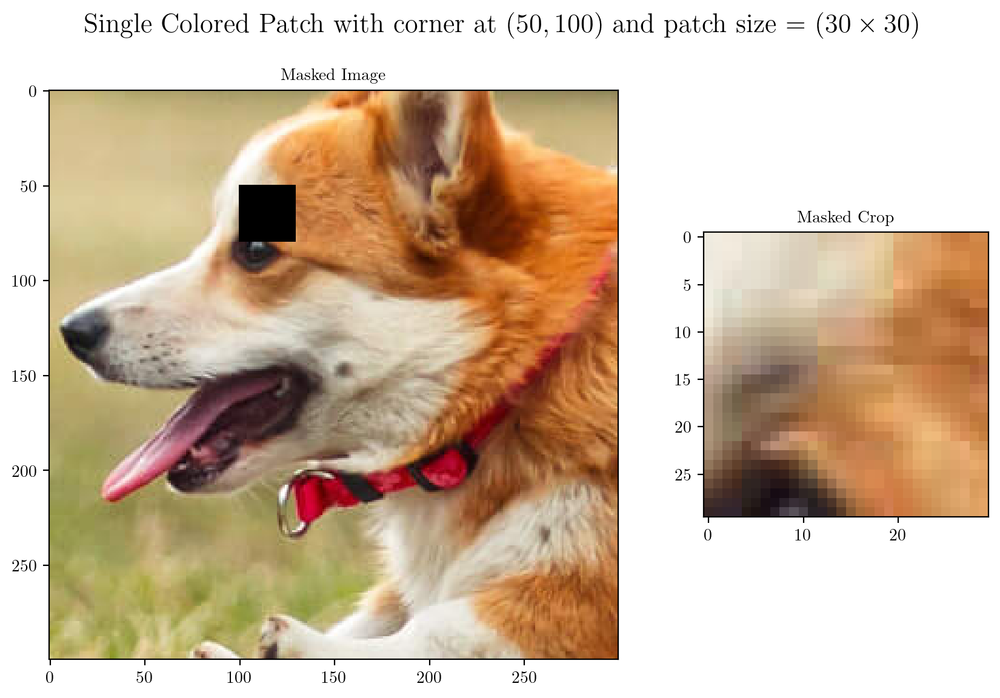

In [84]:
imgDSingle30, croppedDSingle30 = mask_image(crop, (50, 100), 30, "Single Colored Patch")

In [85]:
X1 = create_coordinate_map(crop)[0]

X_scaled_rff_list = []

batch_size = 100

for i in range(0, len(X1), batch_size):
    X_batch = X1[i : i + batch_size]
    X_rff_batch = create_rff_features(X_batch, features, 0.008)
    X_scaled_rff_list.append(X_rff_batch)

X = torch.cat(X_scaled_rff_list, dim = 0)
print(X.shape)

torch.Size([90000, 8000])


In [86]:
imgSingleX, imgSingleY = create_coordinate_map(imgDSingle30)
batch_size = 100

net = LinearModel(features, 3)
net.to(device)

for i in range(0, len(imgSingleX), batch_size):
    X_batch, Y_batch = imgSingleX[i : i + batch_size], imgSingleY[i : i + batch_size]
    X_rff_batch = create_rff_features(X_batch, features, 0.008)
    
    train(net, 0.005, X_rff_batch, Y_batch, 2500, 1e-6, verbose = False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


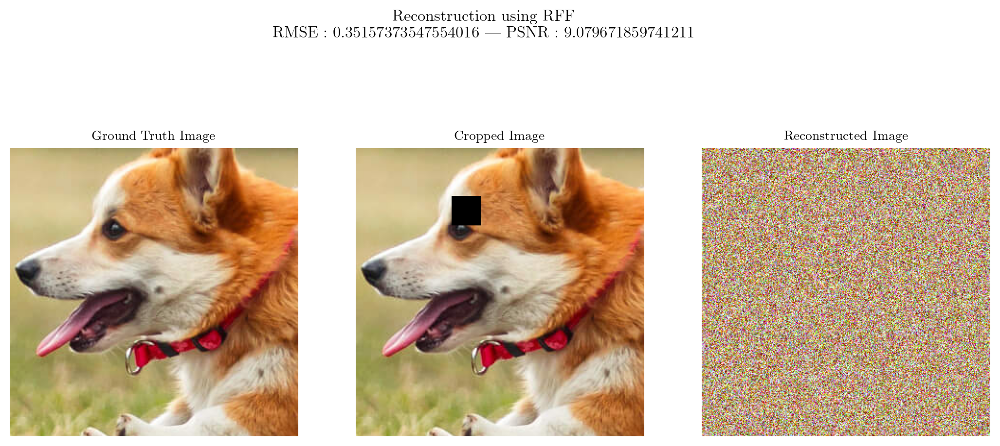

In [89]:
predict_plot(crop, imgDSingle30, net, X)

### $(30 \times 30)$ frame with **Single Color** RFF

In [ ]:
X1 = create_coordinate_map(img_scaled)[0]

X_scaled_rff_list = []

batch_size = 100

for i in range(0, len(X1), batch_size):
    X_batch = X1[i : i + batch_size]
    X_rff_batch = create_rff_features(X_batch, features, 0.008)
    X_scaled_rff_list.append(X_rff_batch)

X = torch.cat(X_scaled_rff_list, dim = 0)

In [54]:
X.shape

torch.Size([273280, 5000])

In [49]:
imgSingleX, imgSingleY = create_coordinate_map(imgSingle30)
batch_size = 100

net = LinearModel(features, 3)
net.to(device)

for i in range(0, len(imgSingleX), batch_size):
    X_batch, Y_batch = imgSingleX[i : i + batch_size], imgSingleY[i : i + batch_size]
    X_rff_batch = create_rff_features(X_batch, features, 0.008)
    
    train(net, 0.005, X_rff_batch, Y_batch, 2500, 1e-6, verbose = False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


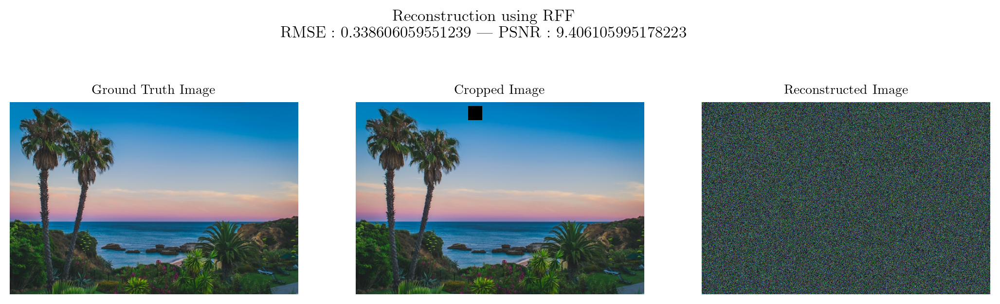

In [63]:
predict_plot(img_scaled, imgSingle30, net, X)

### $(30 \times 30)$ frame with **2-3 Colors** RFF

In [ ]:
imgSingleX, imgSingleY = create_coordinate_map(imgDouble30)
X_rff = create_rff_features(imgSingleX, features, 0.008)
print(X_rff.shape)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)
train(net, 0.005, X_rff, imgSingleY, 2500, 1e-6)

In [ ]:
predict_plot(img_scaled, imgDouble30, net, X)

### $(30 \times 30)$ frame with atleast **5 Colors** RFF

In [ ]:
imgSingleX, imgSingleY = create_coordinate_map(imgMulti30)
X_rff = create_rff_features(imgSingleX, features, 0.008)
print(X_rff.shape)

In [ ]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)
train(net, 0.005, X_rff, imgSingleY, 2500, 1e-6)

In [ ]:
predict_plot(img_scaled, imgMulti30, net, X)